In [221]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
import os
import utils

%matplotlib inline

plt.rcParams['figure.figsize'] = (20.0, 200.0)
plt.rcParams['image.interpolation'] = 'bilinear'

INPUT_DIR = 'data/prepared/'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [225]:
images = utils.load_images(INPUT_DIR)
m_images = utils.load_images('data/marking/')
boxes_dict = {}
for name in m_images:
    img = m_images[name]
    boxes_dict[name] = utils.mark2cnt(img, (7, 2, 251))

In [226]:
def annotate(d=20, sigma=200, blockSize=39, e=0.006, min_h_len=8, min_area_rate=0.42, min_shape_sim=0.3):
    cnts_dict = {}
    hulls_dict = {}
    ths = []
    match_results = []
    circle = utils.create_circle_contour(10)
    for file_name in images:
        img = images[file_name]
        nonoise = cv.bilateralFilter(img, d, sigma, sigma)
        gray = cv.cvtColor(nonoise, cv.COLOR_BGR2GRAY)
        th = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, blockSize, 2)
        ths.append(th)
        _, contours, _ = cv.findContours(th, cv.RETR_LIST, cv.CHAIN_APPROX_TC89_KCOS)
        hulls = []
        approx_contours = []
        for contour in contours:
            epsilon = e * cv.arcLength(contour, True)
            approx = cv.approxPolyDP(contour, epsilon, True)
            approx_contours.append(approx)
            
            if len(contour) < 7:
                continue
                
            # отбор по площади контура
            cnt_area = cv.contourArea(approx)
            if cnt_area < 200:
                continue
                
            # отбор по форме
            hull = cv.convexHull(approx)
            match_result = cv.matchShapes(approx, hull, 1, 0)
            match_results.append(match_result)
            if match_result > min_shape_sim:
                continue

            # отбор по отношению площадей
            hull_area = cv.contourArea(hull)
            area_rate = 0
            if hull_area != 0:
                area_rate = cnt_area / hull_area
            if hull_area > 400 and area_rate > min_area_rate and len(hull) > min_h_len:
                hulls.append(hull)
        cnts_dict[file_name] = approx_contours
        hulls_dict[file_name] = hulls
        cv.drawContours(img, hulls, -1, (255, 0, 0), 1)
    return cnts_dict, hulls_dict, match_results

In [224]:
_, _, match_results = annotate()

error: /io/opencv/modules/imgproc/src/smooth.cpp:3474: error: (-215) (src.type() == (((0) & ((1 << 3) - 1)) + (((1)-1) << 3)) || src.type() == (((0) & ((1 << 3) - 1)) + (((3)-1) << 3))) && src.data != dst.data in function bilateralFilter_8u


count    2051.000000
mean        1.036107
std         2.704771
min         0.000000
25%         0.155969
50%         0.437473
75%         1.232724
max        63.308252
dtype: float64


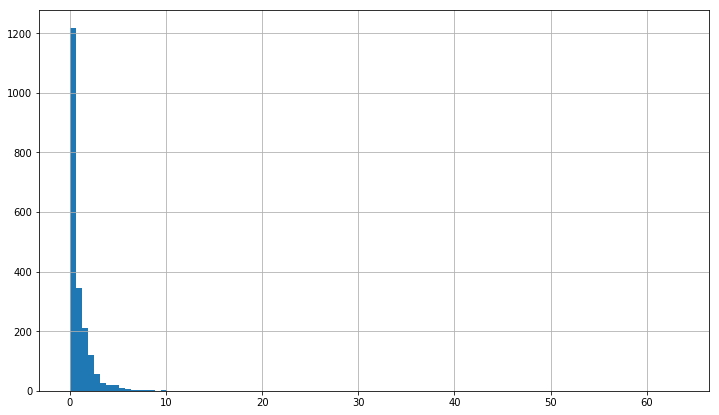

In [182]:
data = pd.Series(match_results)
print(data.describe())
data.hist(bins=100, figsize=(12, 7))

In [197]:
def get_avg_iou(cnts_dict):
    iou_list = []
    iou_dict = {}
    for name, boxes in boxes_dict.items():
        try:
            img = images[name]
            cnts = cnts_dict[name]
            iou = utils.iou(img.shape, cnts, boxes)
            iou_list.append(iou)
            iou_dict[name] = iou
        except KeyError:
            pass
    return sum(iou_list) / len(iou_list)

In [198]:
v_list = [0.1 + x * 0.02 for x in range(20)]
cnts_results = []
hulls_results = []
for v in v_list:
    cnts, hulls, _ = annotate(min_shape_sim=v)
    cnts_result = get_avg_iou(cnts)
    hulls_result = get_avg_iou(hulls)
    cnts_results.append(cnts_result)
    hulls_results.append(hulls_result)
    print('{} h: {}\tc: {}'.format(v, hulls_result, cnts_result))

0.1 h: 0.2292636447804295	c: 0.1691248090931456
0.12000000000000001 h: 0.22096004544814885	c: 0.16811102404018036
0.14 h: 0.21278781548538062	c: 0.16760141089602285
0.16 h: 0.2118635034873154	c: 0.16738237588863952
0.18 h: 0.21515649444506782	c: 0.1673919117525017
0.2 h: 0.2123444947094625	c: 0.16715742507918102
0.22 h: 0.20977702724623506	c: 0.16703806373244942
0.24000000000000002 h: 0.2083324621167694	c: 0.1667110932752434
0.26 h: 0.21484893056377535	c: 0.1667648615865186
0.28 h: 0.21050091023613712	c: 0.16690806196357671
0.30000000000000004 h: 0.21251516431126097	c: 0.16640638041101183
0.32 h: 0.21254676234735084	c: 0.16741569701735293
0.33999999999999997 h: 0.21059095905557426	c: 0.1671619360569919
0.36 h: 0.20904795893535652	c: 0.1670097797425491
0.38 h: 0.2080230554661536	c: 0.1669670406024025
0.4 h: 0.2065471736553151	c: 0.1667935437128633
0.42000000000000004 h: 0.20443227150139193	c: 0.16671438197003224
0.44000000000000006 h: 0.20251416017518734	c: 0.16661181090991978
0.4599999

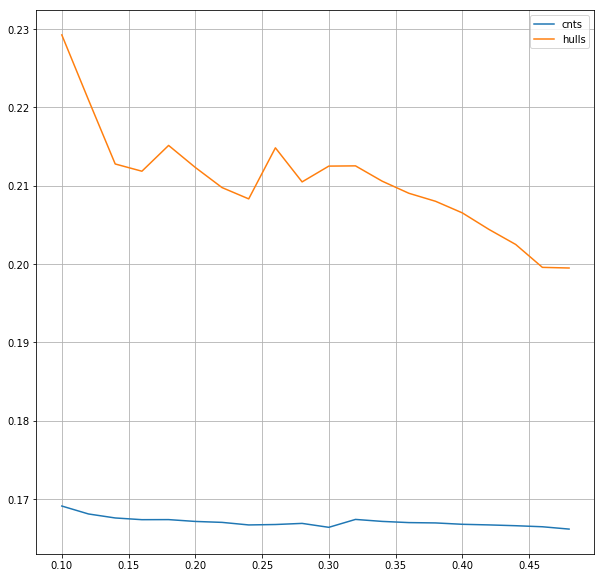

In [211]:
plt.figure(figsize=(10,10))
plt.plot(v_list, cnts_results, label='cnts')
plt.plot(v_list, hulls_results, label='hulls')
plt.legend(loc='best')
plt.grid()
plt.show()

In [227]:
cnts, hulls, _ = annotate()

In [228]:
utils.export_contours_csv("via_draft.csv", hulls)

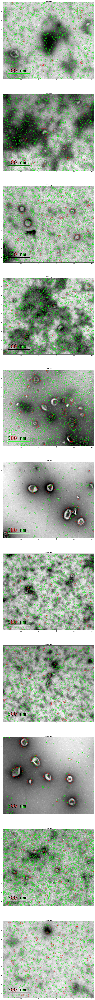

In [229]:
n_rows = len(images)
n_cols = 1
# names = ['03 80k.png', '05 80k.png']
for i, name in enumerate(images):
    img = images[name]
    cv.drawContours(img, cnts[name], -1, (0, 255, 0))
    cv.drawContours(img, hulls[name], -1, (255, 0, 0))
    plt.subplot(n_rows, n_cols, i + 1)
    plt.title(file)
    plt.imshow(img)
#     plt.subplot(n_rows, n_cols, i + 2)
#     plt.title(file)
#     plt.imshow(ths[i], cmap='gray')
plt.show()